In [1]:
import numpy as np
import pandas as pd
import cv2
from pathlib import Path
from sklearn.utils import shuffle
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt

import warnings

warnings.simplefilter('ignore')

In [2]:

df = pd.read_csv('self-driving-cars/labels_train.csv')
df = shuffle(df)
df.head()

,frame,xmin,xmax,ymin,ymax,class_id
39431,1478897046622545665.jpg,53,83,153,172,1
127350,1479505775964692464.jpg,0,50,143,184,1
106194,1479504044350751090.jpg,410,479,105,193,1
113082,1479504597888045767.jpg,294,355,125,171,1
33622,1478896538174168438.jpg,71,103,153,172,1


In [3]:

classes = df.class_id.unique()
print(classes)

[1 3 5 2 4]


In [4]:

labels = { 1:'car', 2:'truck', 3:'person', 4:'bicycle', 5:'traffic light'}

In [5]:

# Get path images and boxes (x,y) for each class_id
boxes = {}
images = {}

base_path = 'self-driving-cars/images/'

for class_id in classes:
    first_row = df[df['class_id'] == class_id].iloc[0]
    
    images[class_id] = cv2.imread(base_path + first_row['frame'])
    boxes[class_id] = [first_row['xmin'],first_row['xmax'],first_row['ymin'],first_row['ymax']]

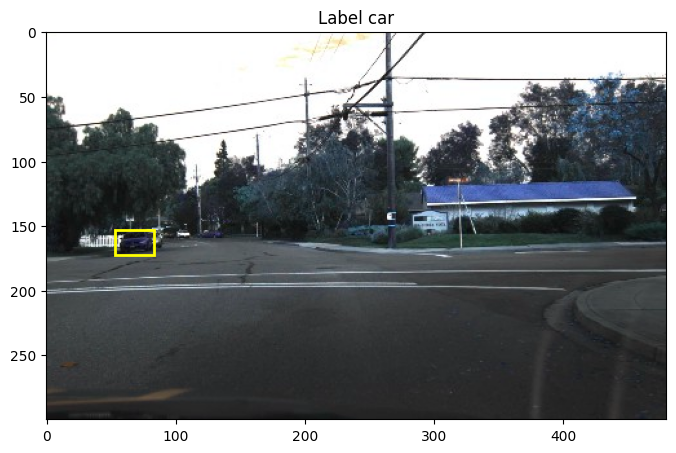

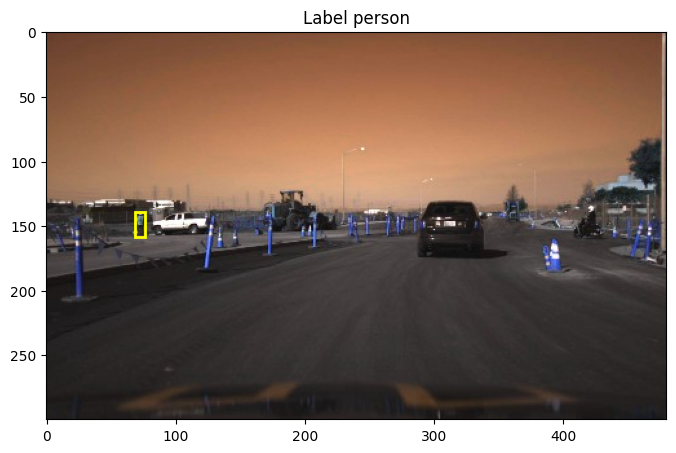

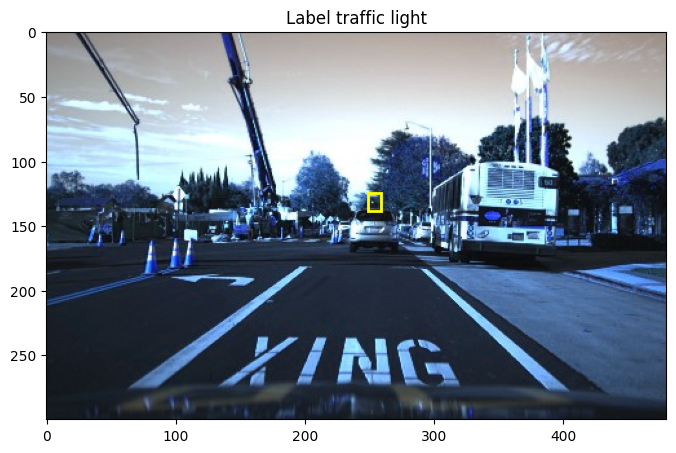

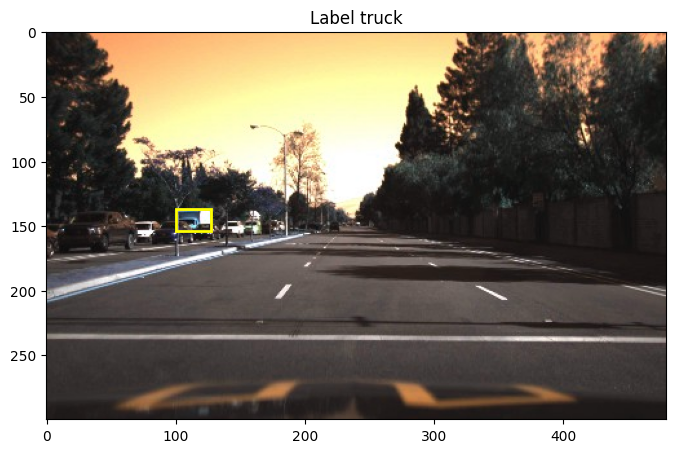

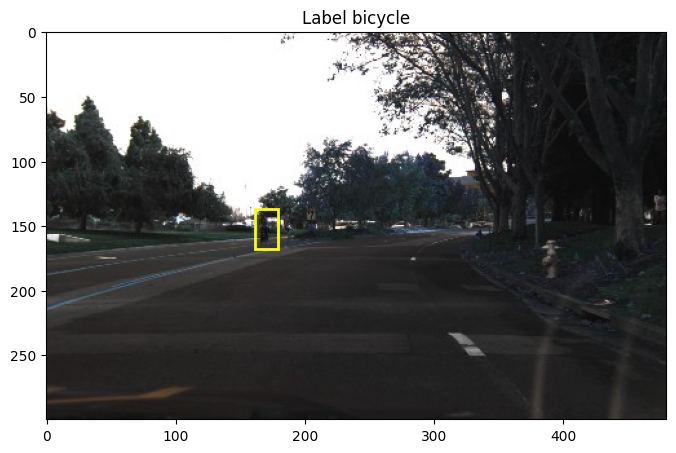

In [6]:

for i in classes:

    xmin, xmax, ymin, ymax = boxes[i][0], boxes[i][1], boxes[i][2], boxes[i][3]

    plt.figure(figsize=(8, 10))
    plt.title("Label " + labels[i])
    plt.imshow(images[i])
    plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color='yellow', fill=False, linewidth=2))
    
    plt.show()

In [7]:
# !pip install ultralytics

In [8]:
from ultralytics import YOLO
import PIL 
from PIL import Image
from IPython.display import display
import os 
import pathlib


In [9]:

model = YOLO("yolov8m.pt")

In [10]:

results=model.predict(source="self-driving-cars/images/1478019956680248165.jpg",
              save=True, conf=0.2,iou=0.5)


image 1/1 /Users/rishabhindoria/Desktop/Projects/Object-Detection-with-Yolo/self-driving-cars/images/1478019956680248165.jpg: 416x640 1 car, 1 truck, 154.6ms
Speed: 2.9ms preprocess, 154.6ms inference, 514.3ms postprocess per image at shape (1, 3, 416, 640)
Results saved to runs/detect/predict3


In [11]:

result = results[0]
box = result.boxes[0]

In [12]:

for result in results:
    boxes = result.boxes  # Boxes object for bbox outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    probs = result.probs  # Class probabilities for classification outputs

In [13]:

cords = box.xyxy[0].tolist()
class_id = box.cls[0].item()
conf = box.conf[0].item()
print("Object type:", class_id)
print("Coordinates:", cords)
print("Probability:", conf)

Object type: 2.0
Coordinates: [124.69143676757812, 142.68826293945312, 148.7809295654297, 162.10047912597656]
Probability: 0.716170072555542


In [14]:

for box in result.boxes:
    class_id = result.names[box.cls[0].item()]
    cords = box.xyxy[0].tolist()
    cords = [round(x) for x in cords]
    conf = round(box.conf[0].item(), 2)
    print("Object type:", class_id)
    print("Coordinates:", cords)
    print("Probability:", conf)
    print("---")

Object type: car
Coordinates: [125, 143, 149, 162]
Probability: 0.72
---
Object type: truck
Coordinates: [141, 139, 157, 154]
Probability: 0.31
---


Enter 'real-time' to start real-time processing or anything else to skip:  q



image 1/1 /Users/rishabhindoria/Desktop/Projects/Object-Detection-with-Yolo/test/DBE0CB8D-51A1-4833-9DFC-128C933B8496_1_102_o.jpeg: 640x384 2 persons, 130.1ms
Speed: 4.3ms preprocess, 130.1ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict3


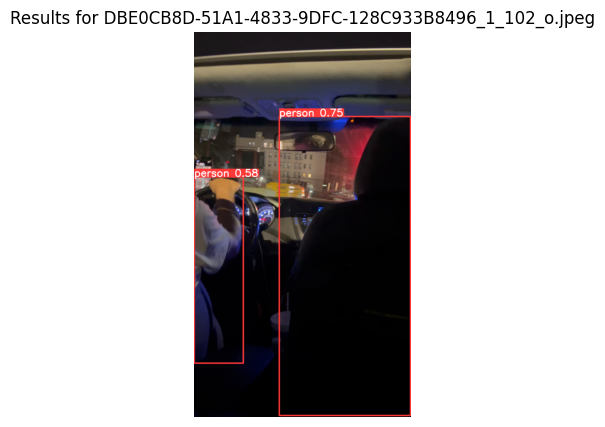


image 1/1 /Users/rishabhindoria/Desktop/Projects/Object-Detection-with-Yolo/test/27413F0D-48B6-419A-9F26-B6829D6FD8DC_1_105_c.jpeg: 416x640 2 persons, 3 cars, 5 traffic lights, 1 fire hydrant, 217.4ms
Speed: 9.6ms preprocess, 217.4ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)
Results saved to runs/detect/predict3


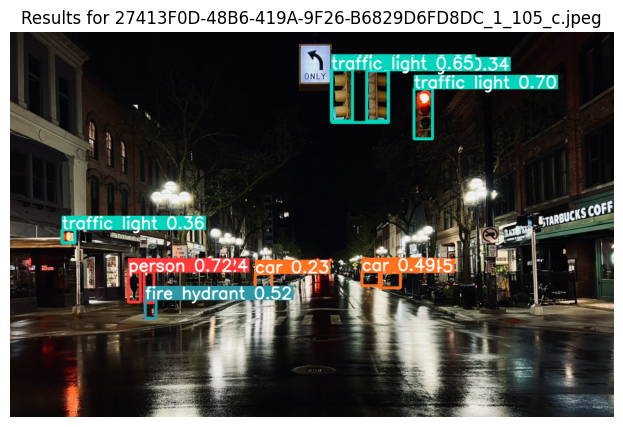


image 1/1 /Users/rishabhindoria/Desktop/Projects/Object-Detection-with-Yolo/test/E2BA107F-D6EA-4BF7-9680-B4A52BEE4CCB_1_105_c.jpeg: 640x384 3 persons, 2 cars, 3 motorcycles, 1 airplane, 1 parking meter, 120.2ms
Speed: 1.1ms preprocess, 120.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict3


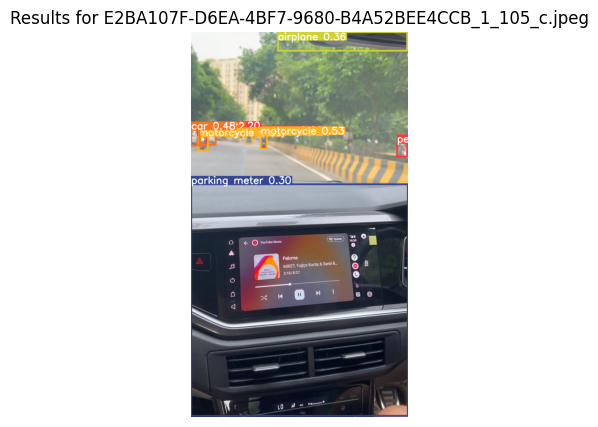


0: 640x384 2 persons, 1 chair, 133.4ms
Speed: 3.1ms preprocess, 133.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


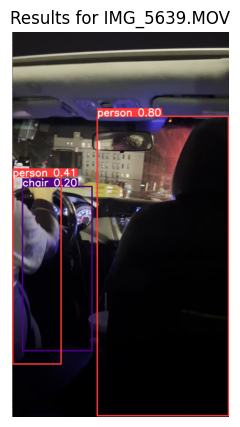


0: 640x384 2 persons, 1 car, 148.9ms
Speed: 1.4ms preprocess, 148.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


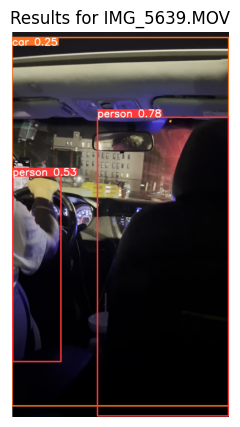


0: 640x384 2 persons, 140.2ms
Speed: 1.9ms preprocess, 140.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


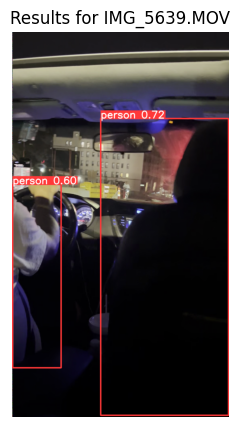


0: 640x384 2 persons, 1 bowl, 151.6ms
Speed: 2.4ms preprocess, 151.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


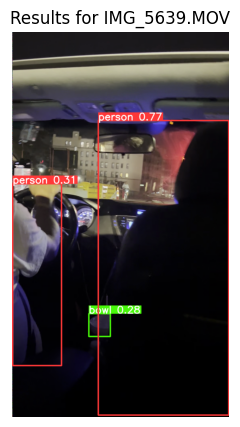


0: 640x384 1 person, 1 bottle, 1 bowl, 135.9ms
Speed: 1.4ms preprocess, 135.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


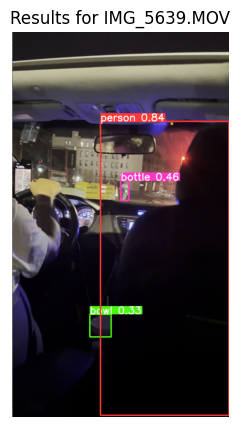


0: 640x384 2 persons, 1 car, 1 bottle, 141.0ms
Speed: 3.2ms preprocess, 141.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


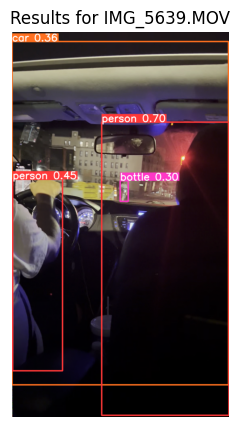


0: 640x384 2 persons, 2 bottles, 1 chair, 112.7ms
Speed: 8.8ms preprocess, 112.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


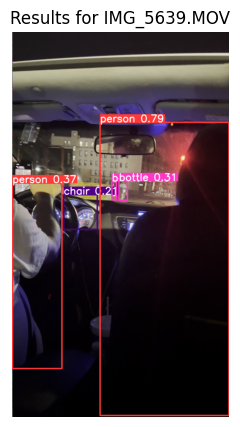


0: 640x384 2 persons, 1 bottle, 1 chair, 110.7ms
Speed: 1.2ms preprocess, 110.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


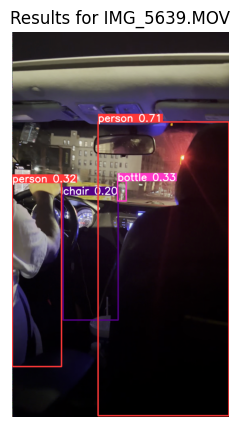


0: 640x384 2 persons, 124.7ms
Speed: 3.1ms preprocess, 124.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


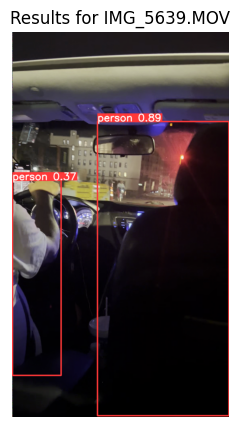


0: 640x384 2 persons, 145.5ms
Speed: 3.6ms preprocess, 145.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


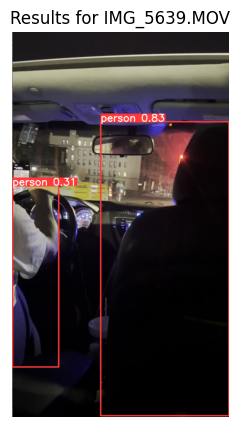


0: 640x384 3 persons, 143.2ms
Speed: 1.6ms preprocess, 143.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


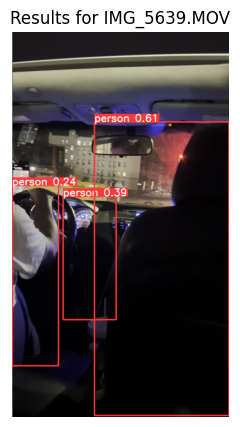


0: 640x384 2 persons, 117.4ms
Speed: 1.9ms preprocess, 117.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


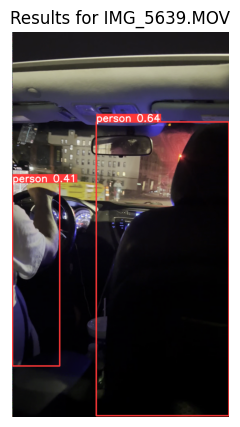


0: 640x384 2 persons, 124.3ms
Speed: 1.3ms preprocess, 124.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


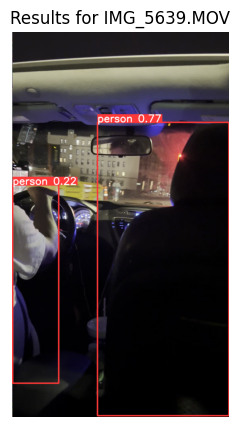


0: 640x384 2 persons, 1 chair, 115.7ms
Speed: 1.3ms preprocess, 115.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


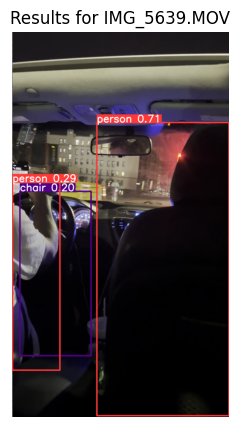


0: 640x384 2 persons, 113.7ms
Speed: 1.4ms preprocess, 113.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


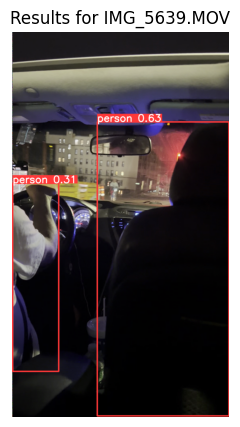


0: 640x384 2 persons, 1 car, 116.5ms
Speed: 1.3ms preprocess, 116.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 384)


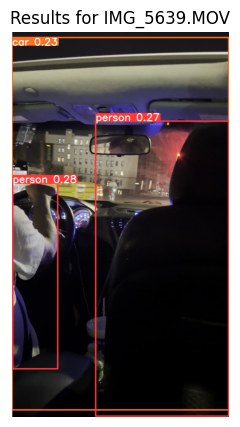


0: 640x384 2 persons, 1 bottle, 114.8ms
Speed: 1.5ms preprocess, 114.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


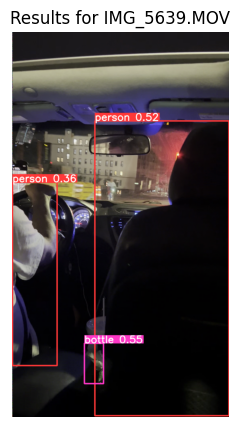


0: 640x384 2 persons, 1 bottle, 117.3ms
Speed: 2.2ms preprocess, 117.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


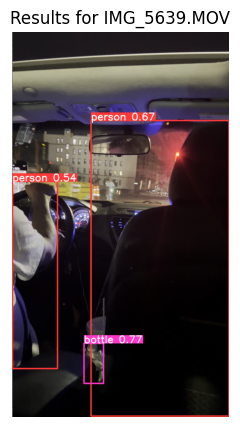


0: 640x384 2 persons, 1 bottle, 1 chair, 117.2ms
Speed: 5.0ms preprocess, 117.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


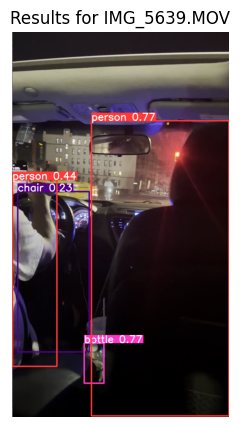


0: 640x384 2 persons, 2 bottles, 1 chair, 116.3ms
Speed: 1.4ms preprocess, 116.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


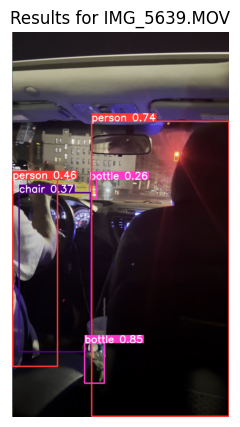


0: 640x384 2 persons, 1 bottle, 1 chair, 117.4ms
Speed: 1.6ms preprocess, 117.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


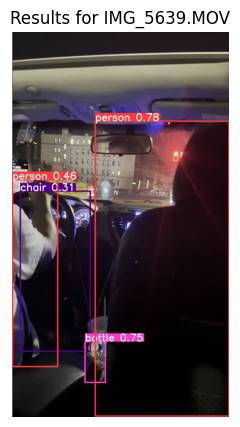


0: 640x384 1 person, 2 bottles, 1 cup, 2 chairs, 115.1ms
Speed: 1.5ms preprocess, 115.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


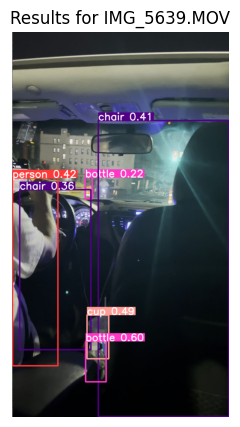


0: 640x384 2 persons, 1 bottle, 1 cup, 2 chairs, 120.8ms
Speed: 1.1ms preprocess, 120.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


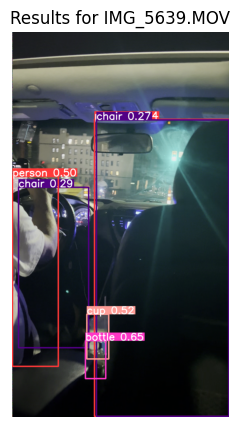


0: 640x384 2 persons, 1 bottle, 1 cup, 114.6ms
Speed: 1.0ms preprocess, 114.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


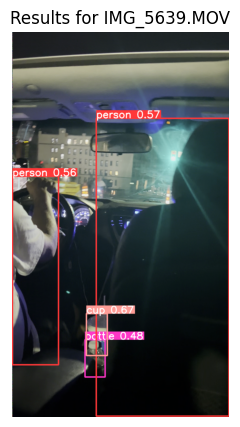


0: 640x384 2 persons, 1 bottle, 1 cup, 1 chair, 135.0ms
Speed: 1.6ms preprocess, 135.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


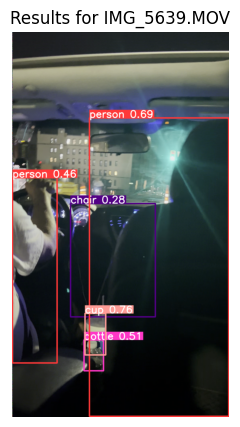


0: 640x384 2 persons, 1 car, 1 bottle, 1 cup, 1 chair, 114.7ms
Speed: 1.3ms preprocess, 114.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


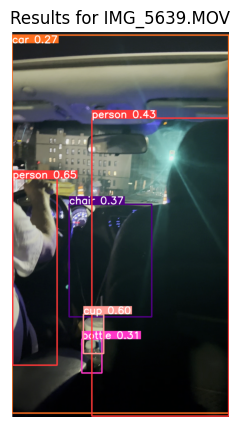


0: 640x384 2 persons, 2 bottles, 115.6ms
Speed: 1.1ms preprocess, 115.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


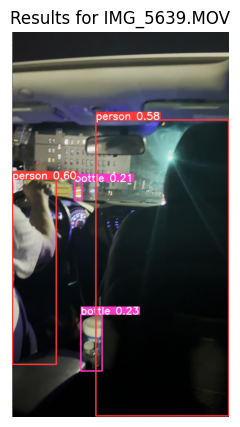


0: 640x384 2 persons, 1 bottle, 1 chair, 115.3ms
Speed: 1.3ms preprocess, 115.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


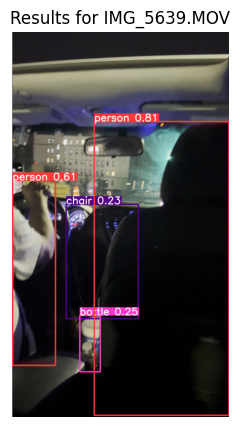


0: 640x384 2 persons, 1 cup, 1 chair, 112.3ms
Speed: 1.2ms preprocess, 112.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


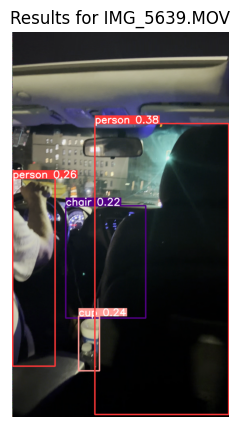


0: 640x384 2 persons, 1 cup, 4 chairs, 1 cell phone, 115.3ms
Speed: 1.2ms preprocess, 115.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


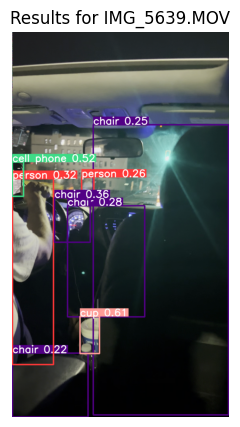


0: 640x384 1 person, 1 bottle, 1 cup, 3 chairs, 117.9ms
Speed: 1.2ms preprocess, 117.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


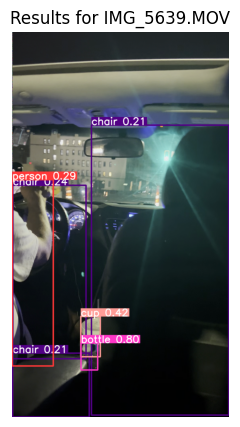


0: 640x384 1 person, 1 bottle, 1 cup, 1 chair, 115.9ms
Speed: 1.3ms preprocess, 115.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


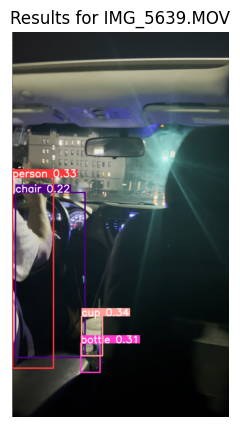


0: 640x384 1 person, 1 car, 1 bottle, 1 cup, 114.2ms
Speed: 1.2ms preprocess, 114.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


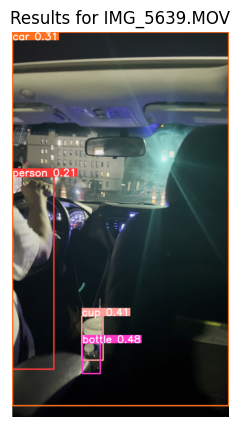


0: 640x384 2 persons, 1 car, 1 bottle, 1 cup, 1 chair, 122.1ms
Speed: 1.0ms preprocess, 122.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


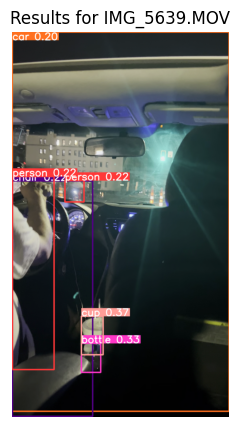


0: 640x384 3 persons, 1 bottle, 1 cup, 2 chairs, 1 cell phone, 115.6ms
Speed: 1.1ms preprocess, 115.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


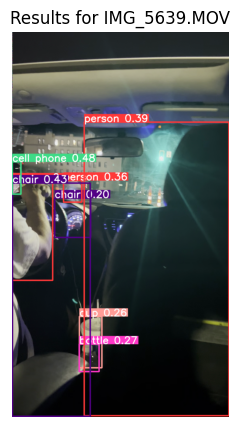


0: 640x384 2 persons, 1 bottle, 2 chairs, 1 cell phone, 117.0ms
Speed: 1.3ms preprocess, 117.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


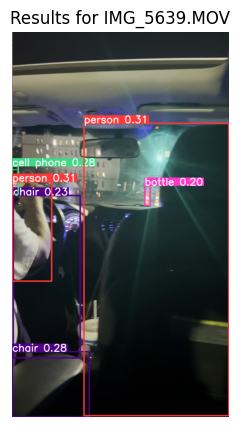


0: 640x384 3 persons, 1 cup, 112.9ms
Speed: 1.1ms preprocess, 112.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


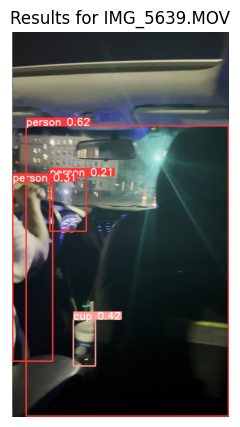


0: 640x384 2 persons, 117.2ms
Speed: 1.0ms preprocess, 117.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


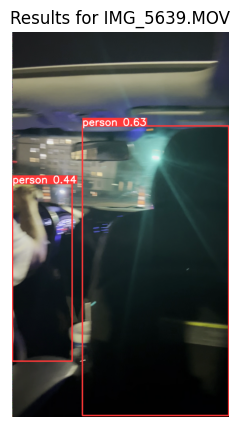


0: 640x384 3 persons, 120.7ms
Speed: 1.5ms preprocess, 120.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 384)


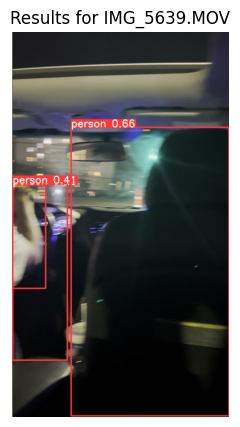


0: 640x384 4 persons, 119.7ms
Speed: 1.2ms preprocess, 119.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


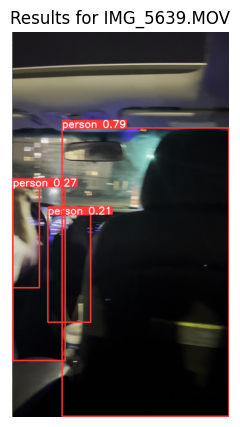


0: 640x384 2 persons, 2 chairs, 120.9ms
Speed: 2.7ms preprocess, 120.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 384)


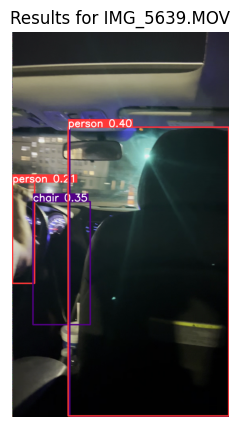


0: 640x384 1 person, 1 cup, 1 chair, 142.7ms
Speed: 1.3ms preprocess, 142.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


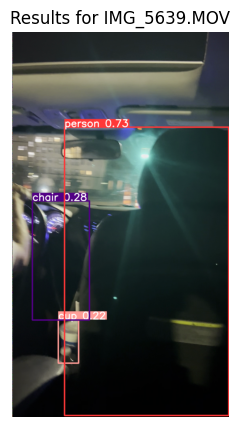


0: 640x384 2 persons, 1 chair, 142.9ms
Speed: 1.4ms preprocess, 142.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


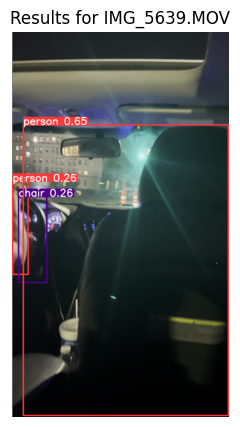


0: 640x384 2 persons, 123.8ms
Speed: 1.2ms preprocess, 123.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 384)


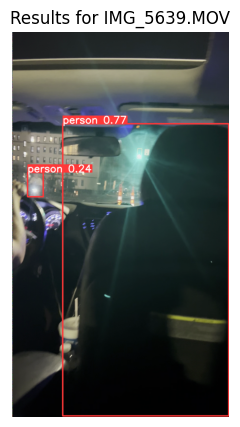


0: 640x384 2 persons, 1 bottle, 132.5ms
Speed: 1.1ms preprocess, 132.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


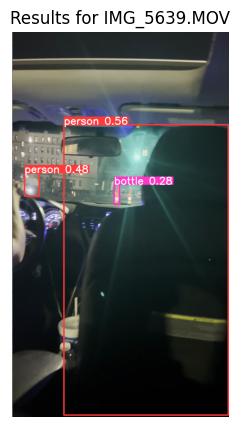


0: 640x384 2 persons, 1 bottle, 1 cup, 1 chair, 152.5ms
Speed: 1.2ms preprocess, 152.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


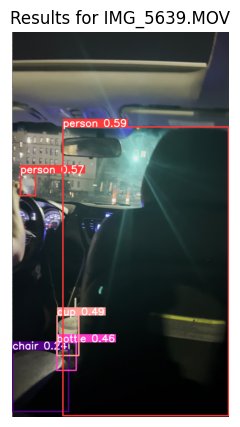


0: 640x384 1 person, 146.7ms
Speed: 1.3ms preprocess, 146.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)


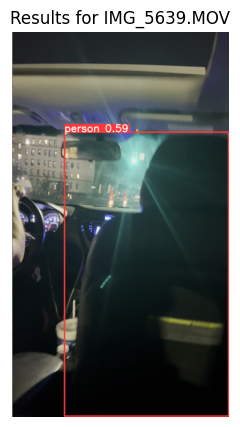


0: 640x384 (no detections), 117.6ms
Speed: 1.3ms preprocess, 117.6ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 384)

image 1/1 /Users/rishabhindoria/Desktop/Projects/Object-Detection-with-Yolo/test/C253D987-C62E-4B66-A248-1CA02964345B_1_105_c.jpeg: 640x480 4 cars, 1 airplane, 1 truck, 147.7ms
Speed: 1.3ms preprocess, 147.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/detect/predict3


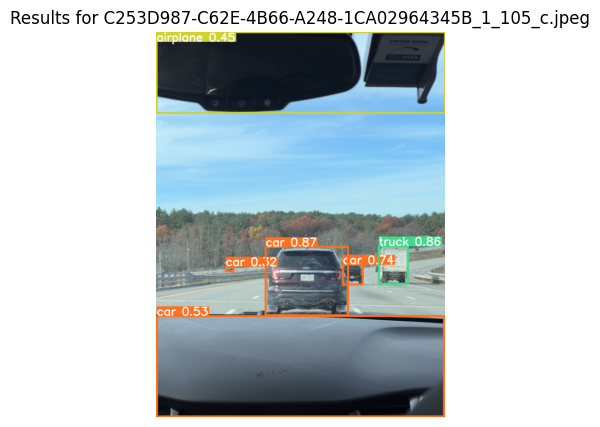


image 1/1 /Users/rishabhindoria/Desktop/Projects/Object-Detection-with-Yolo/test/B7DAF65D-EE83-4477-8EAB-FED655B5CA94_1_105_c.jpeg: 480x640 5 cars, 181.0ms
Speed: 1.4ms preprocess, 181.0ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict3


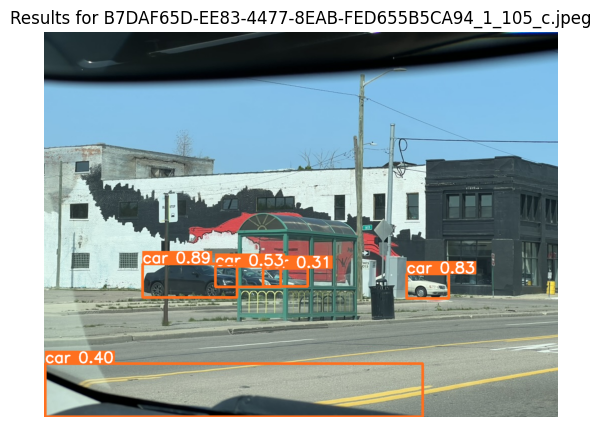

In [16]:
folder_path = 'test/'
files = Path(folder_path).glob('*')  # All files

if input("Enter 'real-time' to start real-time processing or anything else to skip: ") == 'real-time':
    cap = cv2.VideoCapture(0)  # 0 is typically the default camera
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                print("Failed to capture frame; exiting...")
                break
            
            result = model.predict(source=frame, save=False, conf=0.2, iou=0.5)
            if result and result[0]:
                plot = result[0].plot()
                plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
                cv2.imshow('Real-time Detection', cv2.cvtColor(plot, cv2.COLOR_RGB2BGR))
            
            if cv2.waitKey(1) & 0xFF == ord('q') or cv2.getWindowProperty('Real-time Detection', cv2.WND_PROP_VISIBLE) < 1:
                break  # Exit if 'q' is pressed or the window is closed
    except Exception as e:
        print(f"An error occurred: {e}")
    finally:
        cap.release()
        cv2.destroyAllWindows()

else:
    # Process each file in the folder
    for file_path in files:
        file_type = file_path.suffix.lower()
        
        if file_type in ['.jpg', '.jpeg', '.png']:
            # Handle images
            result = model.predict(source=str(file_path), save=True, conf=0.2, iou=0.5)
            
            if result and result[0]:
                plot = result[0].plot()
                plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)  # Convert color for correct display
                plt.figure(figsize=(10, 5))
                plt.imshow(plot)
                plt.title(f'Results for {file_path.name}')
                plt.axis('off')
                plt.show()
    
        elif file_type in ['.mp4', '.avi', '.mov']:
            # Handle videos
            cap = cv2.VideoCapture(str(file_path))
            while cap.isOpened():
                ret, frame = cap.read()
                if not ret:
                    break
    
                # Process each frame
                result = model.predict(source=frame, save=False, conf=0.2, iou=0.5)
                
                # Optionally, display the frame with predictions
                if result and result[0]:
                    plot = result[0].plot()
                    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
                    plt.figure(figsize=(10, 5))
                    plt.imshow(plot)
                    plt.title(f'Results for {file_path.name}')
                    plt.axis('off')
                    plt.show()
                else:
                    break  # Exit if no frame is found
    
            cap.release()



# Cleanup
cv2.destroyAllWindows()

